**Выпускная квалификационная работа Виктории И.**
<br>
**Тема: Прогнозирование конечных свойств новых материалов (композиционных материалов)**

# 1. ИМПОРТ ИСПОЛЬЗУЕМЫХ БИБЛИОТЕК



In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, r2_score

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, SGDRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping

import os
from google.colab import files
import warnings
warnings.filterwarnings('ignore')

# 2. РАЗВЕДОЧНЫЙ АНАЛИЗ И ПРЕДОБРАБОТКА ДАННЫХ



## Импорт и объединение данных

In [2]:
# Импортирую файл X_bp (базальтопластик)
x_bp = pd.read_excel('X_bp.xlsx', index_col=0)
# Первично ознакамливаюсь с содержимым файла
x_bp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [3]:
# Посмотрим на структуру датасета X_bp (базальтопластик)
x_bp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1023 entries, 0 to 1022
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10)
memory usage: 87.9 KB


In [4]:
# Импортирую файл X_nup (углепластик)
x_nup = pd.read_excel('X_nup.xlsx', index_col=0)
# Первично ознакамливаюсь с содержимым файла
x_nup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.0,57.0
1,0,4.0,60.0
2,0,4.0,70.0
3,0,5.0,47.0
4,0,5.0,57.0


In [5]:
# Посмотрим на структуру датасета X_nup (углепластик)
x_nup.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1040 entries, 0 to 1039
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1040 non-null   int64  
 1   Шаг нашивки         1040 non-null   float64
 2   Плотность нашивки   1040 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 32.5 KB


In [6]:
# К датасету X_bp присоединяю X_nup типом объединения INNER и вывожу итоговый датасет
df = x_bp.merge(x_nup, left_index = True, right_index = True, how = 'inner')
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074


### Проверка на пропуски и дубли

In [7]:
# Посмотрим на структуру данных в объединенном датасете df
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки           

In [8]:
# Проверяю датасет на наличие пропусков в данных
df.isnull().sum()

,0
Соотношение матрица-наполнитель,0
"Плотность, кг/м3",0
"модуль упругости, ГПа",0
"Количество отвердителя, м.%",0
"Содержание эпоксидных групп,%_2",0
"Температура вспышки, С_2",0
"Поверхностная плотность, г/м2",0
"Модуль упругости при растяжении, ГПа",0
"Прочность при растяжении, МПа",0
"Потребление смолы, г/м2",0


In [9]:
print(f"Пропуски: {df.isnull().sum().sum()}")
print(f"Дубли: {df.duplicated().sum()}")

Пропуски: 0
Дубли: 0


Пропуски и дубли отсутствуют, обработка не требуется.

### Предобработка данных


In [10]:
# Считаю кол-во уникальных значений в каждом столбце датасета
df.nunique()

,0
Соотношение матрица-наполнитель,1014
"Плотность, кг/м3",1013
"модуль упругости, ГПа",1020
"Количество отвердителя, м.%",1005
"Содержание эпоксидных групп,%_2",1004
"Температура вспышки, С_2",1003
"Поверхностная плотность, г/м2",1004
"Модуль упругости при растяжении, ГПа",1004
"Прочность при растяжении, МПа",1004
"Потребление смолы, г/м2",1003


In [11]:
# В столбце "Угол нашивки, град" всего 2 уникальных значения: 0 и 90 (видно из шага с объединением таблиц)
# Проверяю количество записей с углом нашивки = 0 градусов
print(f"Количество записей с углом нашивки 0 градусов: {int(df['Угол нашивки, град'][df['Угол нашивки, град'] == 0.0].count())}")

Количество записей с углом нашивки 0 градусов: 520


In [12]:
# Привожу значения столбца к бинарному виду, где 0 останется 0, а 90 станет 1
df = df.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}})
# Задаю формат int
df['Угол нашивки, град'] = df['Угол нашивки, град'].astype(int)

In [13]:
# Поскольку теперь столбец показывает не градусы, а сам факт - логично его переименовать
df = df.rename(columns={'Угол нашивки, град' : 'Угол нашивки'})
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Угол нашивки,Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1,6.313201,58.261074


In [14]:
# Контрольная проверка количества 0 после преобразования
print(f"Количество записей с углом нашивки 0 градусов: {int(df['Угол нашивки'][df['Угол нашивки'] == 0.0].count())}")

Количество записей с углом нашивки 0 градусов: 520


In [15]:
# Столбец с индексами перевожу в формат int
df.index = df.index.astype('int')

## Разведочный анализ

### Описательная статистика (mean, min, max, 25%, 50%, 75%)

In [16]:
# Описательная статистика. Транспонирую для удобства чтения
a = df.describe()
a.T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


### Boxplot

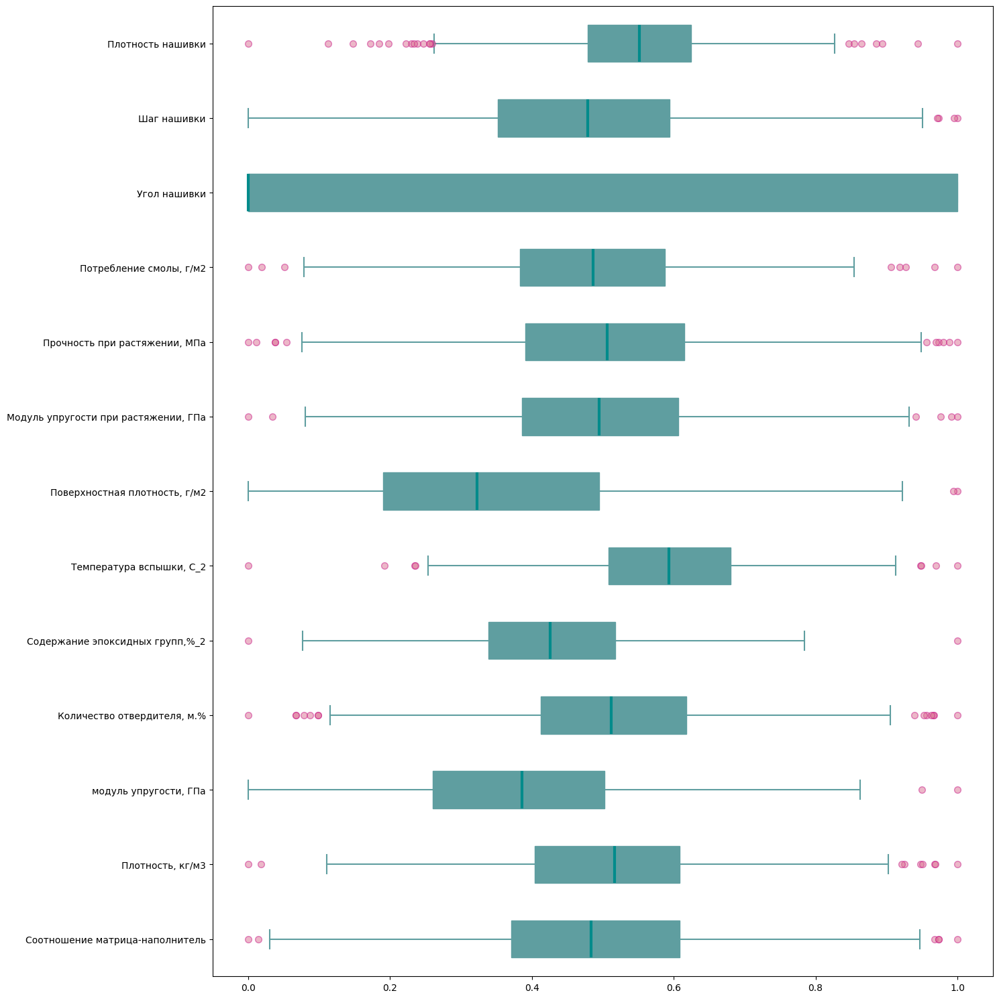

In [17]:
# Масштабирую данные
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Настраиваю график
plt.figure(figsize=(15,15))
plt.boxplot(
    df_scaled,
    tick_labels=df.columns,
    patch_artist=True,
    vert=False,
    boxprops=dict(facecolor='cadetblue', color='cadetblue'),
    medianprops=dict(color='darkcyan', linewidth=3),
    whiskerprops=dict(color='cadetblue', linewidth=1.5),
    capprops=dict(color='cadetblue', linewidth=1.5),
    flierprops=dict(marker='o', markerfacecolor='palevioletred', markeredgecolor='mediumvioletred', markersize=7, alpha=0.5)
)
plt.tight_layout()
plt.show()

Ящики с усами показывают наличие выбросов во всех столбцах кроме "Угол нашивки".
<br>
Также признаки имеют разные масштабы, что может исказить работу алгоритмов в дальнейшем.
<br>
Перед началом моделирования требуется провести очистку от выбросов и нормализацию признаков.

### Гистограммы распределения

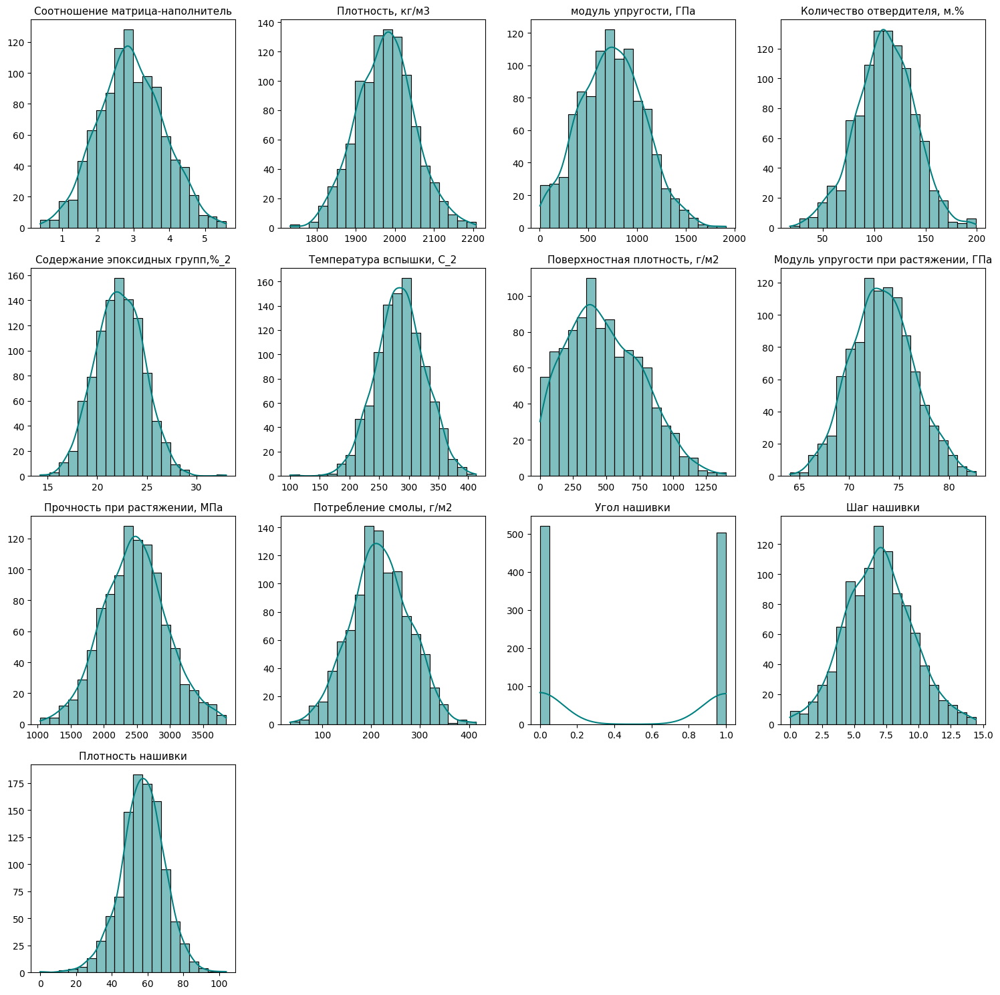

In [18]:
a, b, c = 4, 4, 1
plt.figure(figsize=(15,15))
for col in df.columns:
    plt.subplot(a, b, c)
    sns.histplot(df[col], kde=True, bins=20, color='teal')
    plt.title(col, size=11)
    plt.ylabel('')
    plt.xlabel('')
    c += 1
plt.tight_layout()
plt.show()

Визуально все параметры (за исключением "Угол нашивки") стремятся к нормальному распределению.

### Попарные графики рассеяния точек

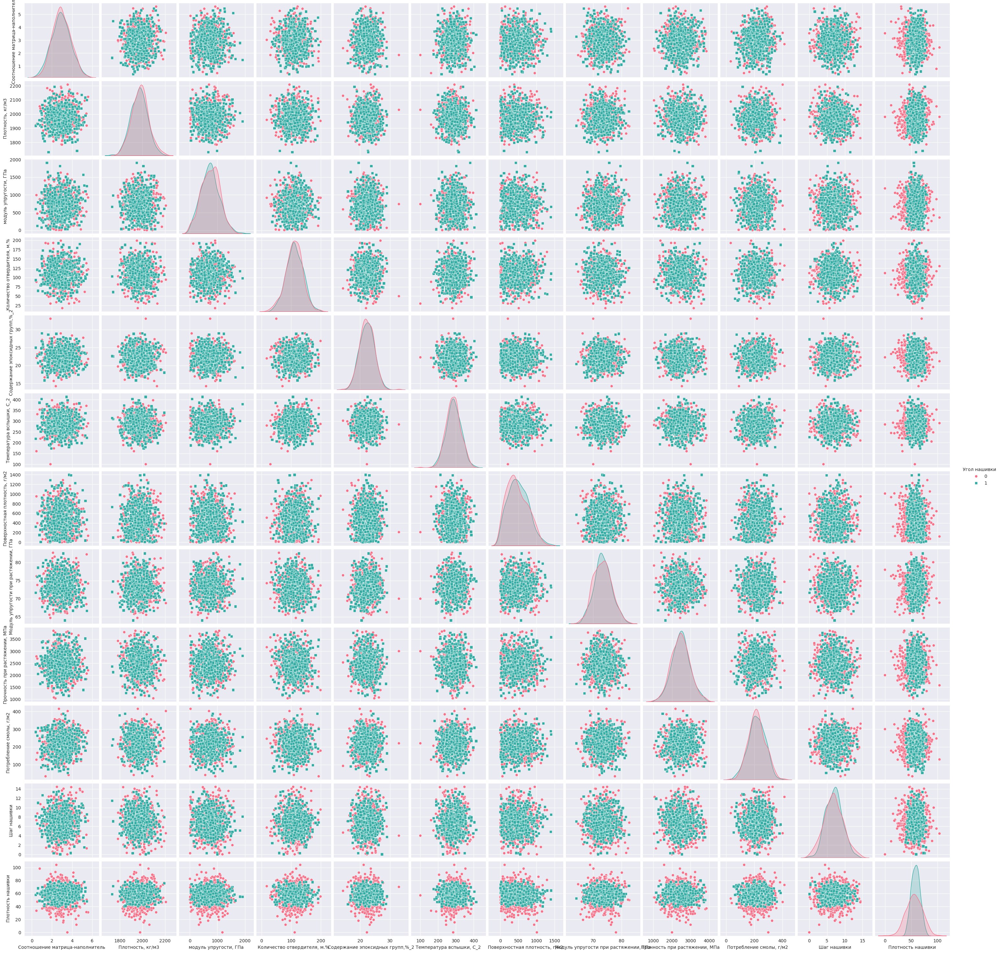

In [19]:
sns.set_style('darkgrid')
sns.pairplot(df, hue='Угол нашивки', markers=["o", "s"], diag_kind='auto', palette='husl');

Попарные графики рассеяния точек также не показывают какой-либо зависимости между данными.
<br>
Зависимость между показателями не линейная, взаимосвязь отсутствует.
На графиках видны выбросы (некоторые точки располагаются далеко от общего скопления).

Скаттерплоты

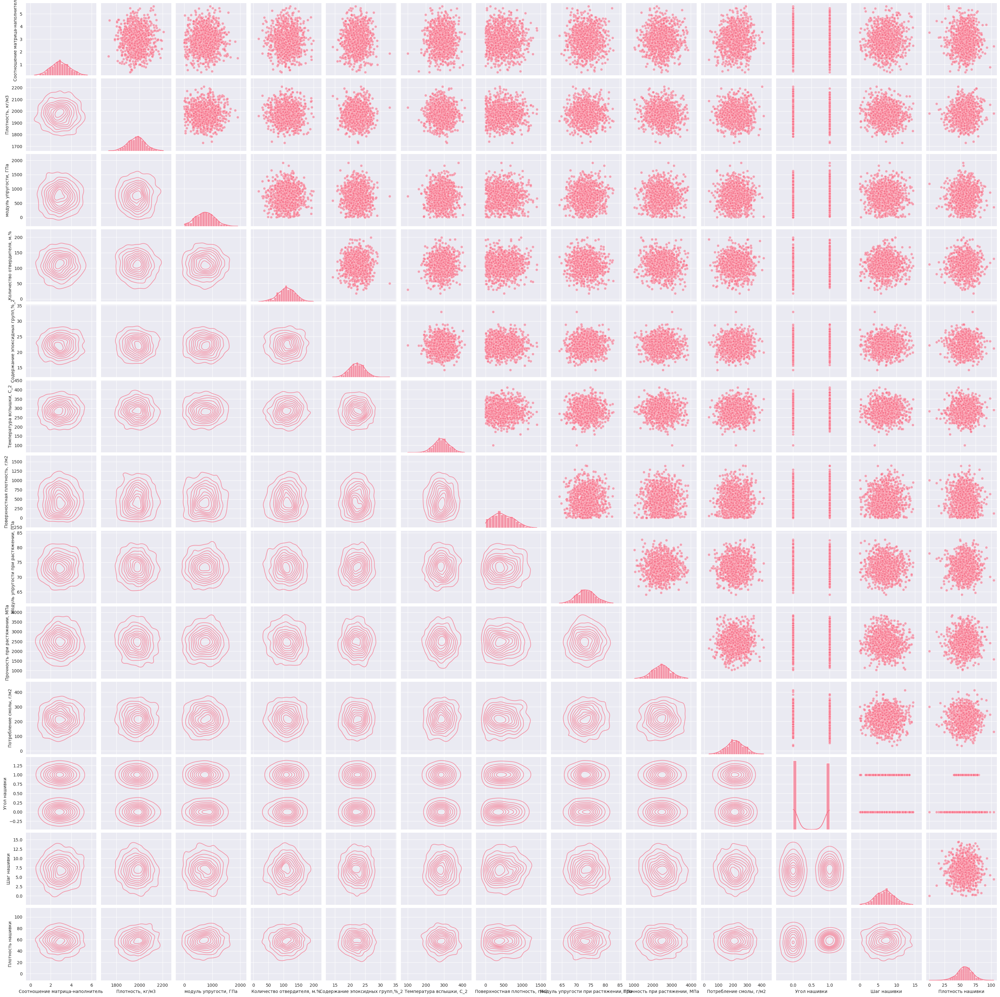

In [20]:
sns.set_palette("husl")
g = sns.PairGrid(df)
g.map_diag(sns.histplot, kde=True, alpha=0.7)
g.map_lower(sns.kdeplot, alpha=0.7)
g.map_upper(sns.scatterplot, alpha=0.6)
g.tight_layout()
plt.show()

Корреляция на графиках не прослеживается. Уже не ожидаю её обнаружить, но дополнительно проверю на матрицах корреляций Пирсона и Кендалла.

### Корреляция Пирсона, Кендалла, heatmap

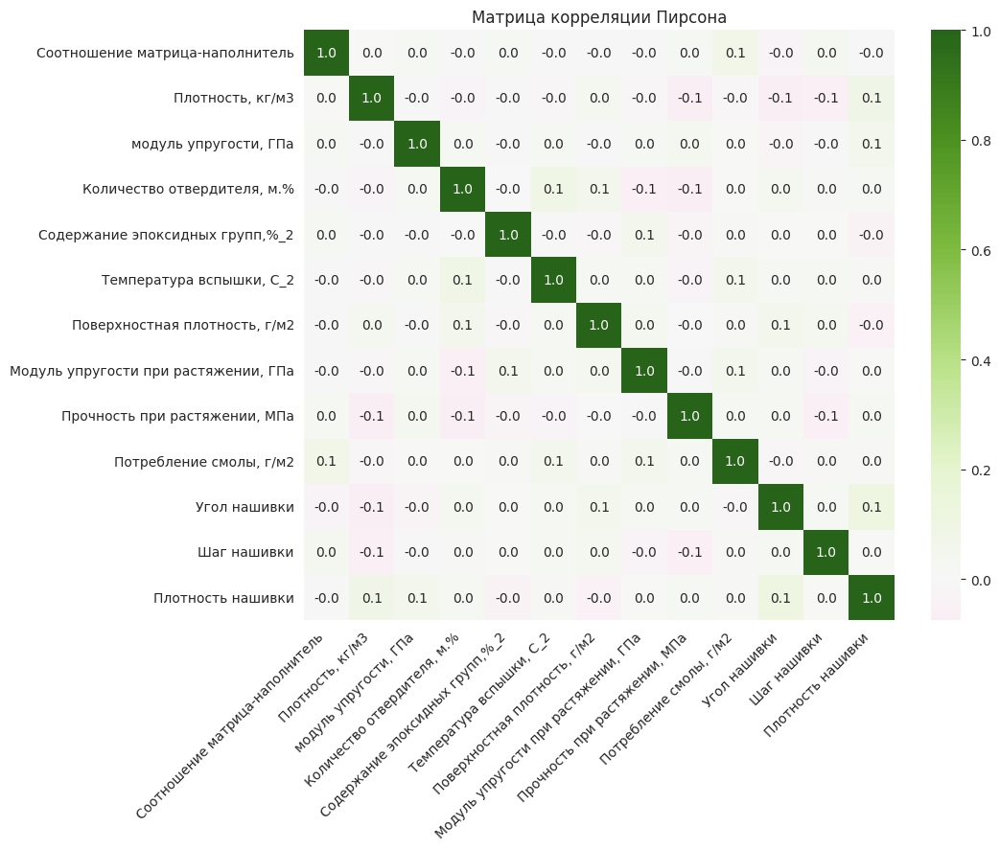

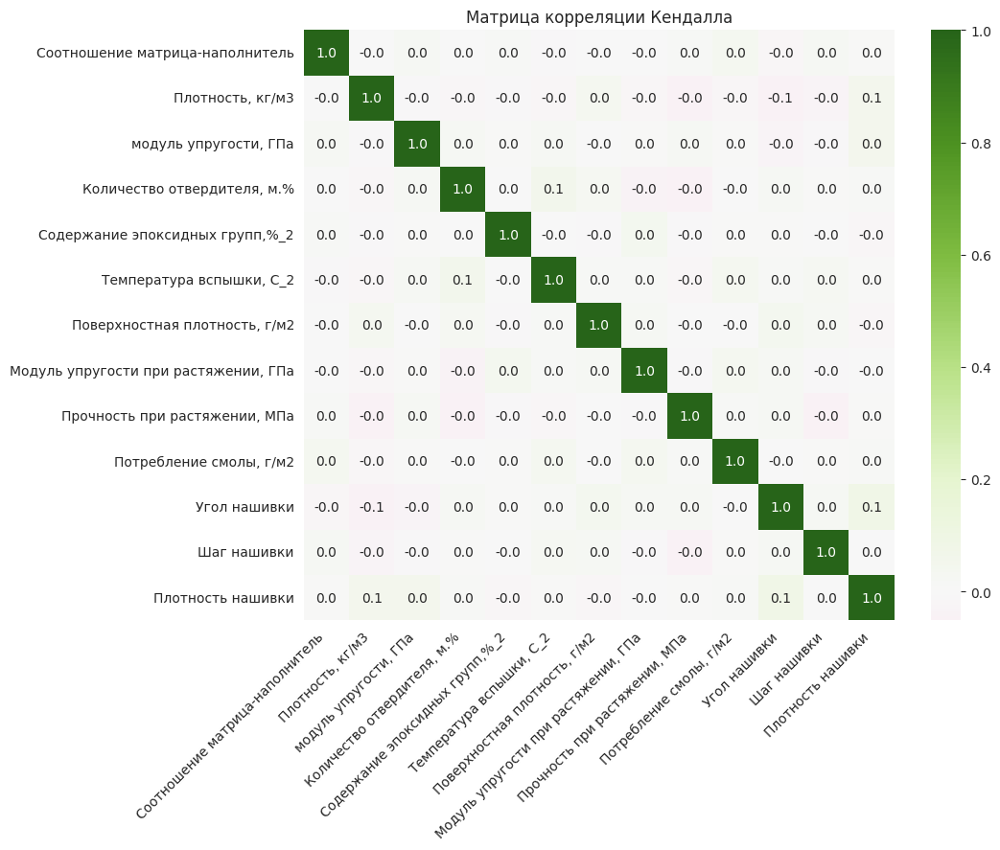

In [21]:
# Вычисляю коэффициенты корреляции Пирсона
corr_pearson = df.corr(method='pearson')

# Строю тепловую карту для наглядности
plt.figure(figsize=(10, 8))
sns.heatmap(corr_pearson, annot=True, fmt='.1f', cmap='PiYG', center=0, square=True)
plt.title('Матрица корреляции Пирсона')
plt.xticks(rotation = 45, ha='right')
plt.show()


# Вычисляю коэффициенты корреляции Кендалла
corr_kendall = df.corr(method='kendall')

# Строю тепловую карту для наглядности
plt.figure(figsize=(10, 8))
sns.heatmap(corr_kendall, annot=True, fmt='.1f', cmap='PiYG', center=0, square=True)
plt.title('Матрица корреляции Кендалла')
plt.xticks(rotation = 45, ha='right')
plt.show()

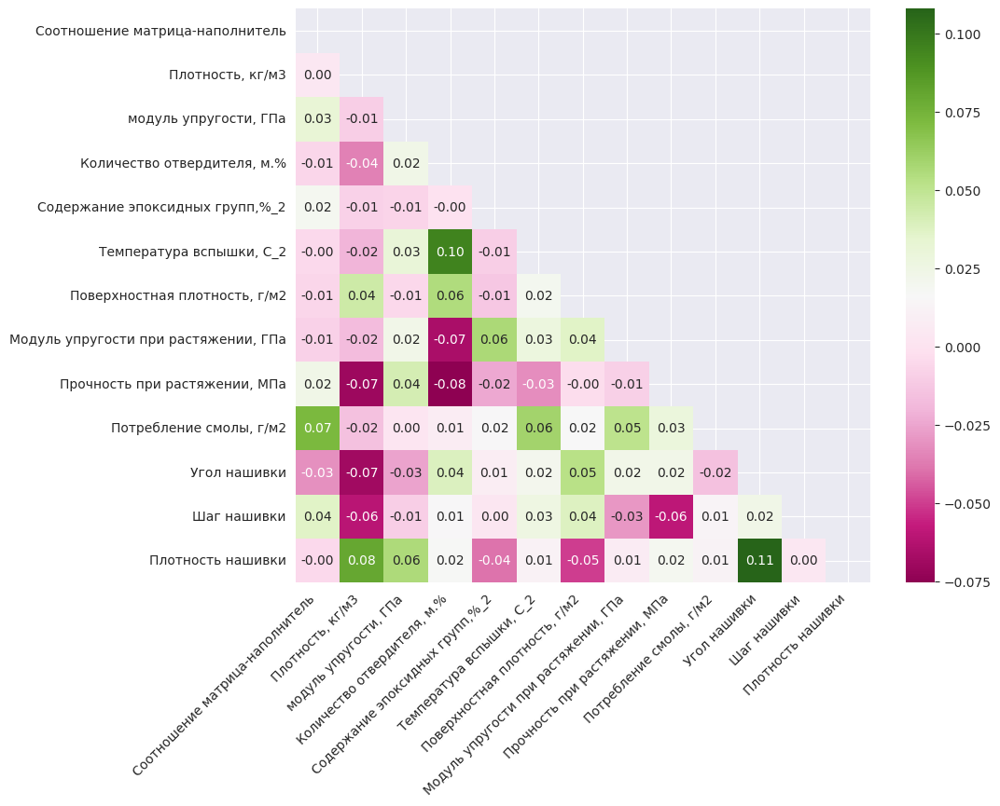

In [22]:
mask = np.triu(df.corr())
f, ax = plt.subplots(figsize = (10, 8))
sns.heatmap(df.corr(), mask = mask, annot = True, fmt='.2f', square = True, cmap = 'PiYG')
plt.xticks(rotation = 45, ha='right')
plt.show()

Статистической зависимости между переменными не обнаружено.
<br>
Максимальная корреляция наблюдается между Плотностью нашивки и Углом нашивки и составляет всего 0.11, что не является статистически значимой величиной.
<br>
Корреляция между всеми переменными близка к 0, что говорит об отсутствии корреляционной связи между переменными.

### Q-Q Графики

Сравниваем реальное распределение данных с теоретическим нормальным распределением.
Если точки лежат близко к прямой линии — данные примерно нормально распределены.

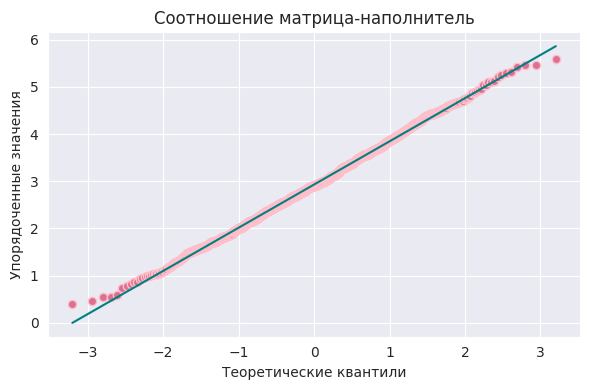

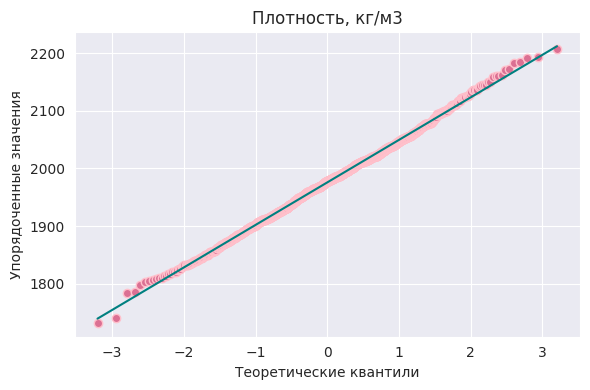

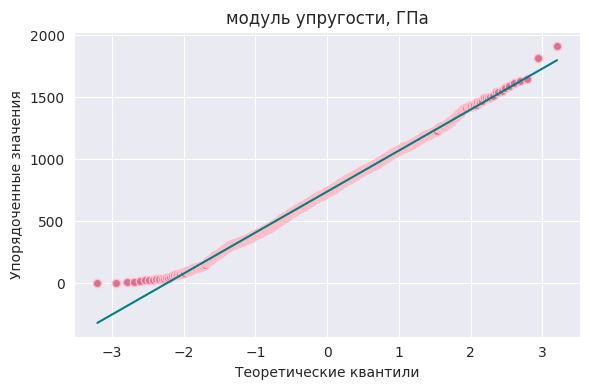

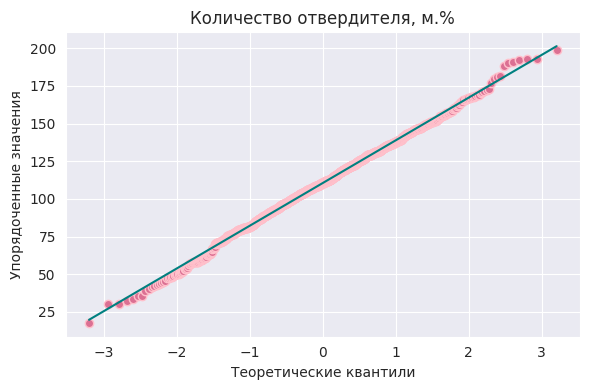

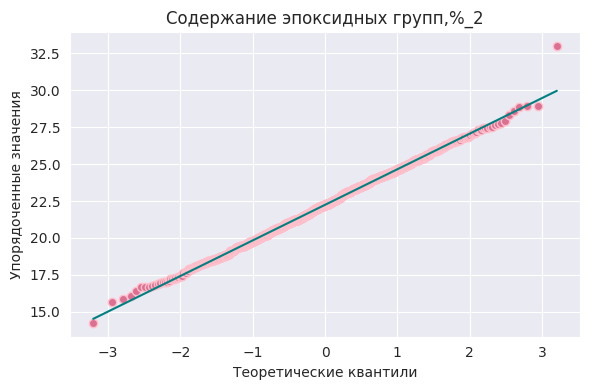

...

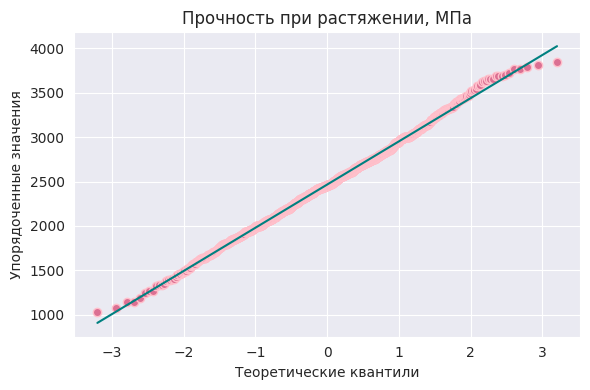

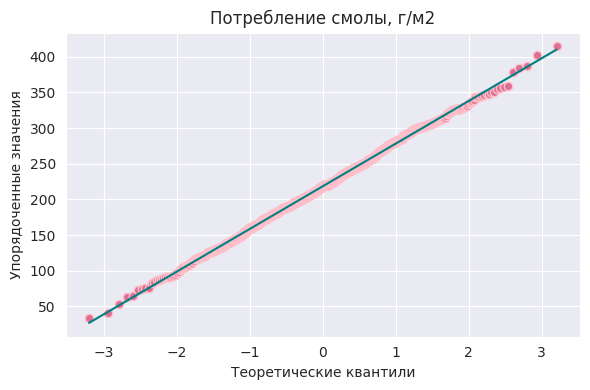

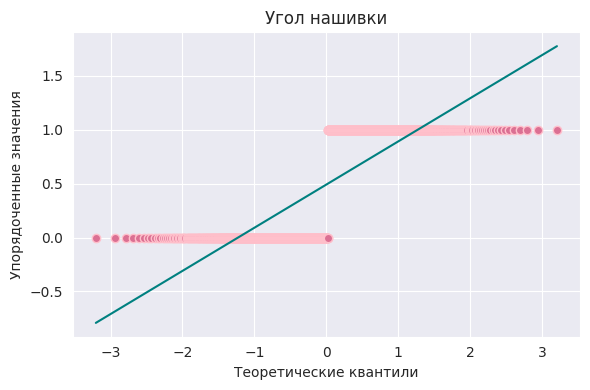

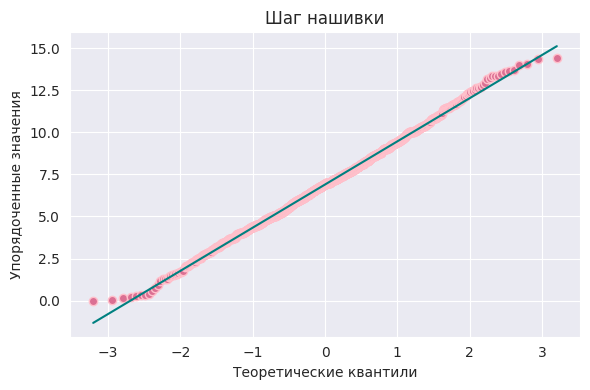

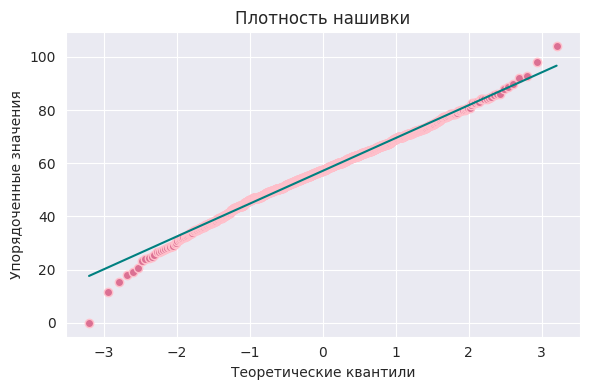

In [23]:
for col in df.columns:
    plt.figure(figsize=(6, 4))
    stats.probplot(df[col], dist="norm", plot=plt)
    ax = plt.gca()
    ax.get_lines()[0].set_markerfacecolor('palevioletred')
    ax.get_lines()[0].set_markeredgecolor('pink')
    ax.get_lines()[1].set_color('teal')
    ax.get_lines()[1].set_linewidth(1.5)
    plt.title(col, fontsize=12)
    plt.xlabel("Теоретические квантили", fontsize=10)
    plt.ylabel("Упорядоченные значения", fontsize=10)
    plt.tight_layout()
    plt.show()

## Очистка данных от выбросов и нормализация признаков

### Очистка выбросов

Ранее я отмечала, что по признакам необходимо провести очистку от выбросов и нормализацию. К этому сейчас и приступим.

In [24]:
# На всякий случай сохраняю оригинальный датасет (до удаления выбросов и нормализации)
df_original = df.copy()

In [25]:
# Рассчитываю границы IQR на исходных данных
iqr_bounds = {}

for col in df.columns:
    q25, q75 = np.percentile(df[col], [25, 75])
    iqr = q75 - q25
    lower_bound = q25 - 1.5 * iqr
    upper_bound = q75 + 1.5 * iqr
    iqr_bounds[col] = (lower_bound, upper_bound)

# Считаю сколько выбросов в каждом столбце
outlier_counts = {}
for col in df.columns:
    lower, upper = iqr_bounds[col]
    n_outliers = ((df[col] < lower) | (df[col] > upper)).sum()
    outlier_counts[col] = n_outliers

print("Количество выбросов (по исходным границам):")
outlier_series = pd.Series(outlier_counts, name='Выбросы')
print(outlier_series)
print(f"\nВсего строк с хотя бы одним выбросом: <= {outlier_series.sum()}")


Количество выбросов (по исходным границам):
Соотношение матрица-наполнитель          6
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             14
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 8
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           11
Потребление смолы, г/м2                  8
Угол нашивки                             0
Шаг нашивки                              4
Плотность нашивки                       21
Name: Выбросы, dtype: int64

Всего строк с хотя бы одним выбросом: <= 93


Решаю удалить выбросы, поскольку их не очень много.

In [26]:
# Создаю маску (оставляю только строки без выбросов по любому из признаков)
keep_mask = pd.Series([True] * len(df), index=df.index)
for col in df.columns:
    lower, upper = iqr_bounds[col]
    keep_mask &= (df[col] >= lower) & (df[col] <= upper)

# Применяю фильтр
df = df[keep_mask].reset_index(drop=True)

print(f"Результат:")
print(f"Исходных строк: {len(df_original)}")
print(f"Осталось строк: {len(df)}")
print(f"Удалено: {len(df_original) - len(df)} ({100*(len(df_original)-len(df))/len(df_original):.1f}%)")

# Проверяю, остались ли выбросы по исходным границам
print("\nОстаточные выбросы:")
remaining_outliers = {}
for col in df.columns:
    lower, upper = iqr_bounds[col]
    n_rem = ((df[col] < lower) | (df[col] > upper)).sum()
    remaining_outliers[col] = n_rem
print(pd.Series(remaining_outliers).sum(), "выбросов")

Результат:
Исходных строк: 1023
Осталось строк: 936
Удалено: 87 (8.5%)

Остаточные выбросы:
0 выбросов


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 936 entries, 0 to 935
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Угол нашивки                          936 non-null    int64  
 11  Шаг нашивки        

### Нормализация признаков

Теперь необходимо привести все признаки к сопоставимому масштабу.

In [28]:
from sklearn.preprocessing import StandardScaler

X = df.copy()
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
df_scaled = pd.DataFrame(X_scaled, columns=X.columns)

print("Нормализация выполнена с использованием StandardScaler.")

Нормализация выполнена с использованием StandardScaler.


Для приведения признаков к единому масштабу применена стандартизация (StandardScaler) из библиотеки scikit-learn.
<br>
Данный метод преобразует каждый признак так, что его среднее значение становится равным 0, а стандартное отклонение = 1.
<br>
Это обеспечивает равноправное участие всех признаков в обучении моделей, особенно тех, что чувствительны к масштабу (линейные модели, SVM, нейронные сети).

Проверю, что получилось после очистки от выбросов по изначальному интервалу и нормализации.


Статистика после стандартизации (должно быть: mean ~ 0, std ~ 1):


,mean,std,min,max
Соотношение матрица-наполнитель,-0.0,1.000535,-2.662564,2.673947
"Плотность, кг/м3",-0.0,1.000535,-2.678494,2.649773
"модуль упругости, ГПа",0.0,1.000535,-2.239686,2.773444
"Количество отвердителя, м.%",-0.0,1.000535,-2.673520,2.624101
"Содержание эпоксидных групп,%_2",-0.0,1.000535,-2.721073,2.818386
"Температура вспышки, С_2",0.0,1.000535,-2.708660,2.540085
"Поверхностная плотность, г/м2",0.0,1.000535,-1.722572,2.886532
"Модуль упругости при растяжении, ГПа",-0.0,1.000535,-2.553495,2.672150
"Прочность при растяжении, МПа",0.0,1.000535,-2.625366,2.670853
"Потребление смолы, г/м2",-0.0,1.000535,-2.663276,2.447193


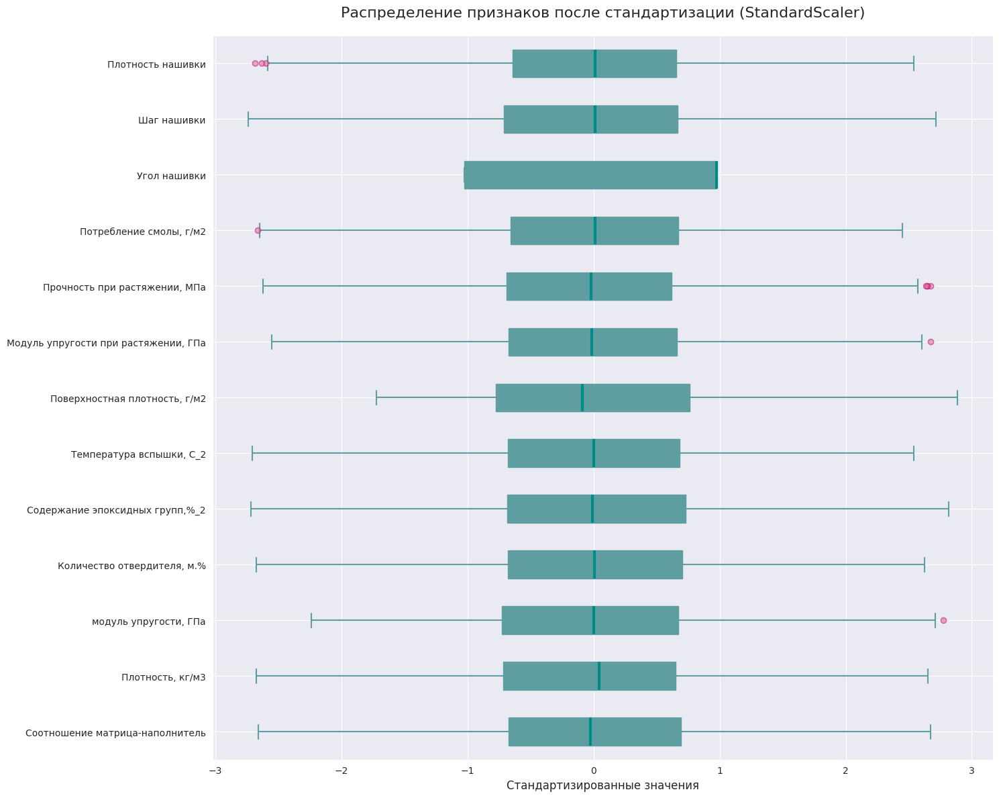

In [29]:
# Статистика после нормализации
stats_after = df_scaled.describe().T[['mean', 'std', 'min', 'max']]
print("Статистика после стандартизации (должно быть: mean ~ 0, std ~ 1):")
display(stats_after.round(6))

# Визуализация горизонтальных boxplot
plt.figure(figsize=(15, 12))

plt.boxplot(df_scaled, tick_labels=df_scaled.columns, patch_artist=True, vert=False,
            boxprops=dict(facecolor='cadetblue', color='cadetblue'),
            medianprops=dict(color='darkcyan', linewidth=3),
            whiskerprops=dict(color='cadetblue', linewidth=1.5),
            capprops=dict(color='cadetblue', linewidth=1.5),
            flierprops=dict(marker='o', markerfacecolor='palevioletred', markeredgecolor='mediumvioletred', markersize=6, alpha=0.6)
            )

plt.title('Распределение признаков после стандартизации (StandardScaler)', fontsize=16, pad=20)
plt.xlabel('Стандартизированные значения', fontsize=12)
plt.tight_layout()
plt.show()

Вижу наличие выбросов на новых интервалах.
<br>
Можно было бы продолжить итеративную очистку и бороться с выбросами до "победного", однако в рамках данной задачи кажется, что такие действия могут привести датасет к искажению и удалить важные экспериментальные точки.
<br>
Принимаю решение не очищать "выбросы" на новом интервале.

Для каждого из параметров построю по 2 графика: гистограмму для проверки распределения и boxplot для обнаружения выбросов.

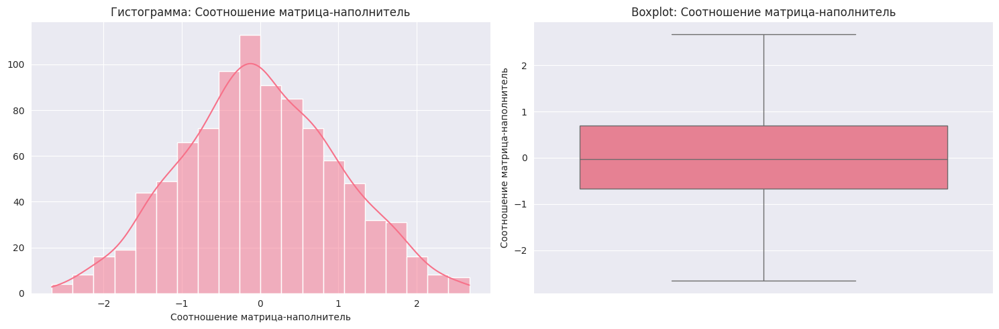

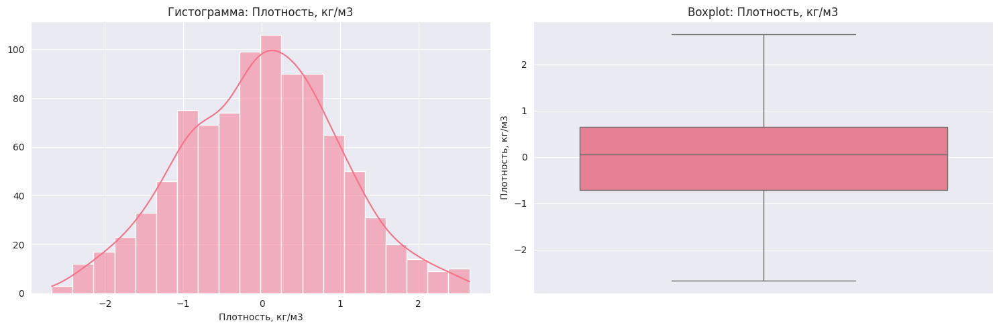

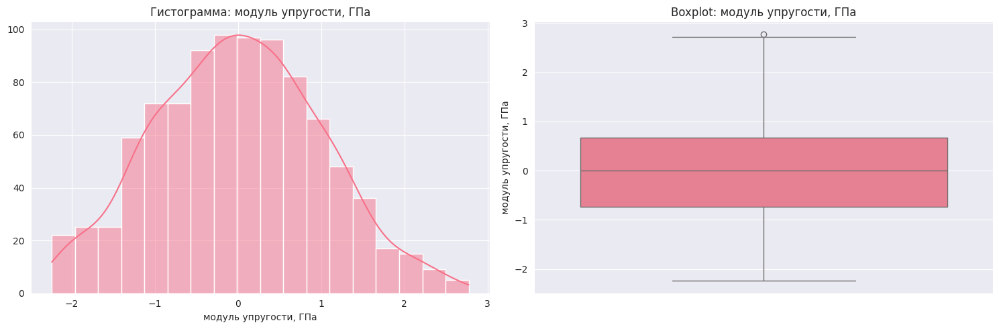

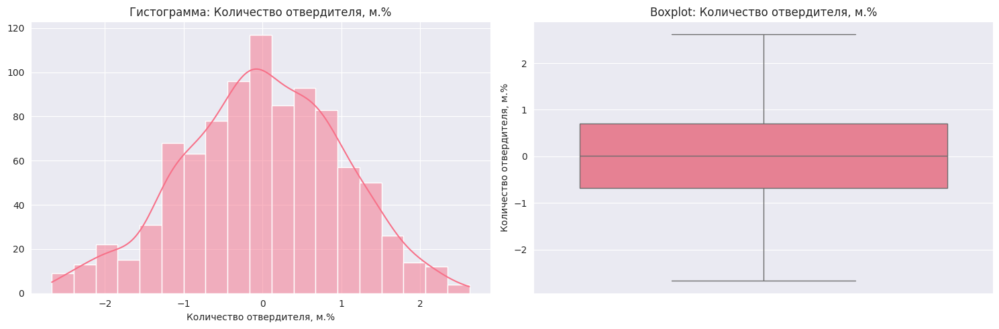

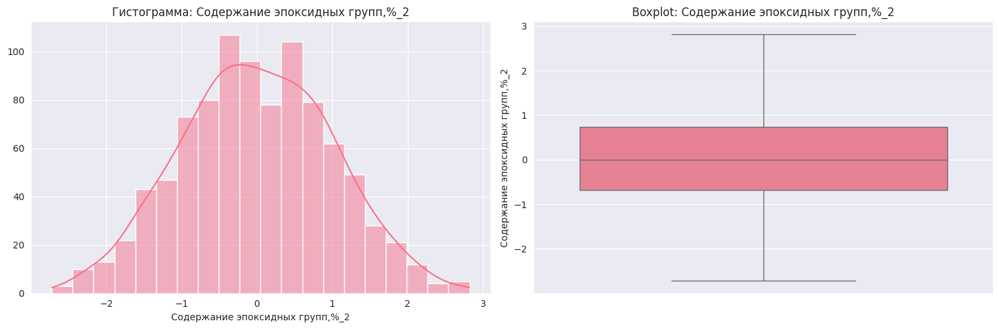

...

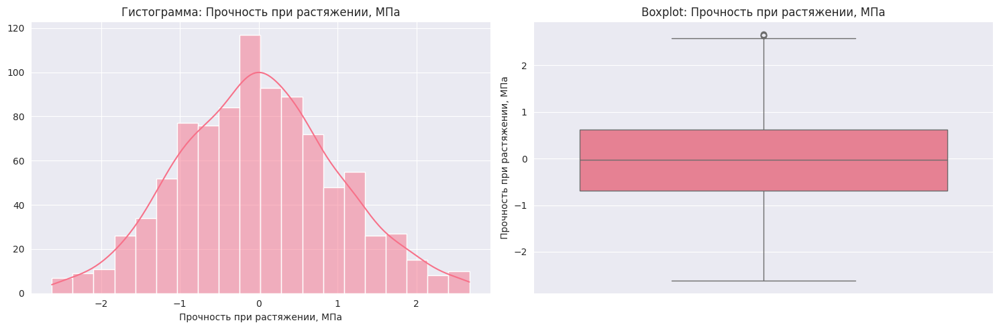

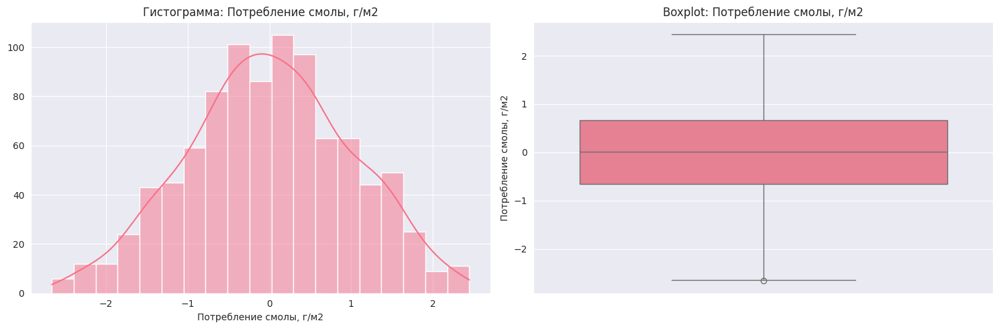

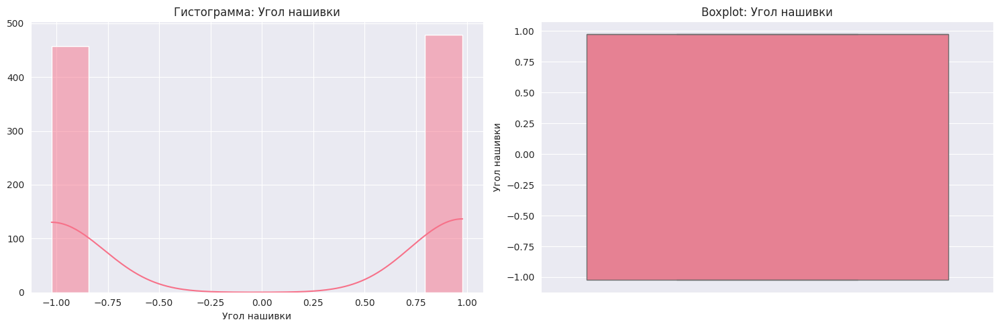

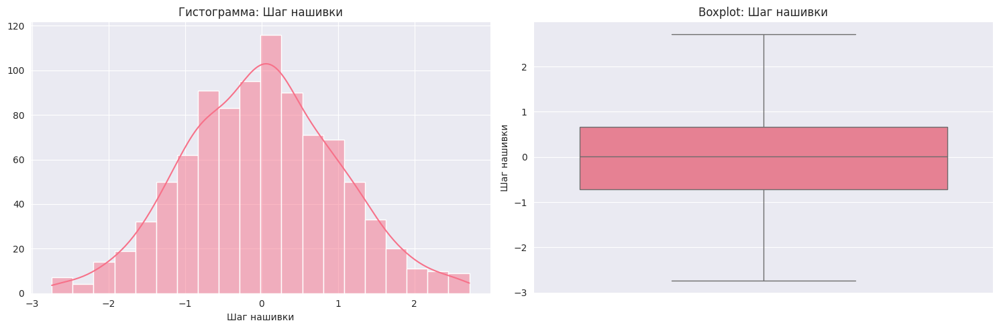

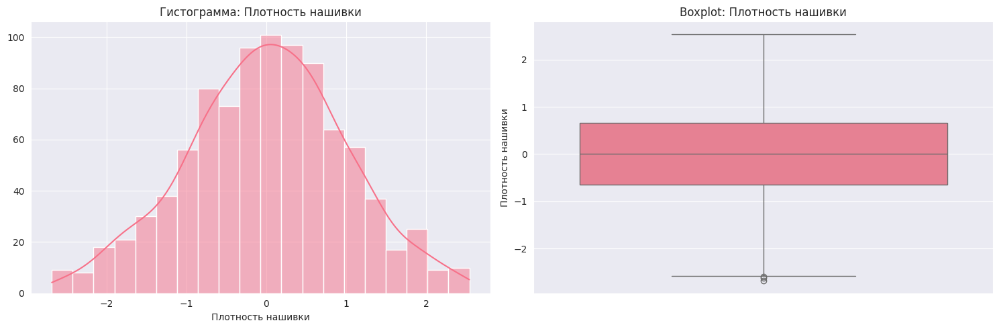

In [30]:
sns.set_palette("husl")
column_names = df.columns

# Для каждого столбца строю свою пару графиков
for col in column_names:
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    # Гистограмма с KDE
    sns.histplot(df_scaled[col], kde=True, ax=axes[0])
    axes[0].set_title(f'Гистограмма: {col}')
    axes[0].set_ylabel('')

    # Boxplot
    sns.boxplot(y=df_scaled[col], ax=axes[1])
    axes[1].set_title(f'Boxplot: {col}')
    axes[1].set_ylabel(col)

    plt.tight_layout()
    plt.show()

После применения стандартизации (StandardScaler):
<br>
Среднее значение каждого признака составляет ~ 0.0, <br>
Стандартное отклонение ~ 1.0, <br>
что подтверждает корректность преобразования.
<br>
На диаграмме boxplot видно, что все признаки теперь находятся в сопоставимом диапазоне (преимущественно от –2.7 до +2.7), а медианы сосредоточены около нуля.
<br>
Выбросы (точки за усами) присутствуют, но их количество минимально - это ожидаемо, так как на этом этапе уже проведена предварительная очистка данных от экстремальных значений.
<br><br>
Таким образом, нормализация выполнена успешно, и данные готовы к использованию в алгоритмах машинного обучения.

# 3. ОБУЧЕНИЕ МОДЕЛЕЙ

## Подготовка к обучению моделей

In [31]:
# Задаю целевые переменные
target1 = 'Модуль упругости при растяжении, ГПа'
target2 = 'Прочность при растяжении, МПа'

# И признаки - все, кроме целевых
feature_cols = [col for col in df.columns if col not in [target1, target2]]
X = df[feature_cols]
y1 = df[target1]
y2 = df[target2]

print(f"Количество признаков: {len(feature_cols)}")
print(f"Целевые переменные: {target1}; {target2}")

Количество признаков: 11
Целевые переменные: Модуль упругости при растяжении, ГПа; Прочность при растяжении, МПа


Разбиваем выборку на обучающую (70%) и тестовую (30%)

In [32]:
# Разбиваю выборку на обучающую и тестовую, устанавливаю параметры для поиска гиперпараметров модели с помощью поиска по сетке
# с перекрестной проверкой, количество блоков равно 10 (cv = 10)
def train_and_evaluate_model(X, y, model_name, model, param_grid, cv=10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    pipe = Pipeline([('scaler', StandardScaler()), ('model', model)])
    grid = GridSearchCV(pipe, param_grid, cv=cv, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=0)
    grid.fit(X_train, y_train)
    y_pred = grid.predict(X_test)
    return {
        'model_name': model_name,
        'MAE': mean_absolute_error(y_test, y_pred),
        'R2': r2_score(y_test, y_pred),
        'best_params': grid.best_params_,
        'best_model': grid.best_estimator_
    }

## Определение набора моделей

In [33]:
models_config = {
    # K ближайших соседей
    'KNN': {
        'model': KNeighborsRegressor(),
        'params': {
            'model__n_neighbors': [3, 5, 7],
            'model__weights': ['uniform', 'distance']
        }
    },

    # Метод опорных векторов для регрессии
    'SVR': {
        'model': SVR(),
        'params': {'model__C': [0.1, 1, 10], 'model__gamma': ['scale', 0.01, 0.1], 'model__kernel': ['rbf']}
    },

    # Дерево решений
    'Decision Tree': {
        'model': DecisionTreeRegressor(random_state=42),
        'params': {
            'model__max_depth': [5, 10, 20, None],
            'model__min_samples_split': [2, 5, 10]
        }
    },

    # Случайный лес
    'Random Forest': {
        'model': RandomForestRegressor(random_state=42),
        'params': {
            'model__n_estimators': [100, 200],
            'model__max_depth': [10, 20, None],
            'model__min_samples_split': [2, 5]
        }
    },

    # Градиентный бустинг
    'Gradient Boosting': {
        'model': GradientBoostingRegressor(random_state=42),
        'params': {
            'model__n_estimators': [100, 200],
            'model__learning_rate': [0.05, 0.1],
            'model__max_depth': [3, 5]
        }
    },

    # SGD Регрессор
    'SGD Regressor': {
        'model': SGDRegressor(random_state=42, max_iter=10000),
        'params': {
            'model__alpha': [0.0001, 0.001, 0.01],
            'model__learning_rate': ['constant', 'optimal'],
            'model__eta0': [0.01, 0.1]
        }
    },

    # Линейная регрессия
    'Linear Regression': {
        'model': LinearRegression(),
        'params': [{}]
    },

    # Многослойный перцептрон
    'MLP Regressor': {
        'model': MLPRegressor(random_state=42, max_iter=1000),
        'params': {
            'model__hidden_layer_sizes': [(50,), (100,), (50, 50)],
            'model__alpha': [0.0001, 0.001],
            'model__learning_rate_init': [0.001, 0.01]
        }
    },

    # Лассо
    'Lasso': {
        'model': Lasso(random_state=42, max_iter=10000),
        'params': {'model__alpha': [0.01, 0.1, 1.0, 10.0]}
    },

    # ElasticNet (гибрид Лассо + Ridge)
    'ElasticNet': {
        'model': ElasticNet(random_state=42, max_iter=10000),
        'params': {
            'model__alpha': [0.01, 0.1, 1.0],
            'model__l1_ratio': [0.2, 0.5, 0.8]
        }
    }
}

In [34]:
results = {target1: [], target2: []}

for target_name, y in [(target1, y1), (target2, y2)]:
    print(f"\nОбучение моделей для: {target_name}")
    for name, cfg in models_config.items():
        print(f"{name}...", end="")
        res = train_and_evaluate_model(X, y, name, cfg['model'], cfg['params'], cv=10)
        results[target_name].append(res)
        print(f" MAE={res['MAE']:.4f}, R2={res['R2']:.4f}")
        print(f"    Лучшие параметры: {res['best_params']}")


Обучение моделей для: Модуль упругости при растяжении, ГПа
KNN... MAE=2.6077, R2=-0.1585
    Лучшие параметры: {'model__n_neighbors': 7, 'model__weights': 'uniform'}
SVR... MAE=2.3982, R2=0.0014
    Лучшие параметры: {'model__C': 0.1, 'model__gamma': 0.1, 'model__kernel': 'rbf'}
Decision Tree... MAE=2.5939, R2=-0.2337
    Лучшие параметры: {'model__max_depth': 5, 'model__min_samples_split': 2}
Random Forest... MAE=2.4366, R2=-0.0255
    Лучшие параметры: {'model__max_depth': 10, 'model__min_samples_split': 5, 'model__n_estimators': 100}
Gradient Boosting... MAE=2.4159, R2=-0.0385
    Лучшие параметры: {'model__learning_rate': 0.05, 'model__max_depth': 3, 'model__n_estimators': 100}
SGD Regressor... MAE=2.5233, R2=-0.0780
    Лучшие параметры: {'model__alpha': 0.01, 'model__eta0': 0.01, 'model__learning_rate': 'constant'}
Linear Regression... MAE=2.4160, R2=-0.0036
    Лучшие параметры: {}
MLP Regressor... MAE=2.8149, R2=-0.4108
    Лучшие параметры: {'model__alpha': 0.0001, 'model__hi

In [35]:
df_results = pd.DataFrame(results[target1])
#print(df_results[['model_name', 'MAE', 'R2', 'best_params']].to_string())
df_results

,model_name,MAE,R2,best_params,best_model
0,KNN,2.607686,-0.158545,"{'model__n_neighbors': 7, 'model__weights': 'u...","(StandardScaler(), KNeighborsRegressor(n_neigh..."
1,SVR,2.398222,0.001412,"{'model__C': 0.1, 'model__gamma': 0.1, 'model_...","(StandardScaler(), SVR(C=0.1, gamma=0.1))"
2,Decision Tree,2.593866,-0.233702,"{'model__max_depth': 5, 'model__min_samples_sp...","(StandardScaler(), DecisionTreeRegressor(max_d..."
3,Random Forest,2.436617,-0.025537,"{'model__max_depth': 10, 'model__min_samples_s...","(StandardScaler(), (DecisionTreeRegressor(max_..."
4,Gradient Boosting,2.415930,-0.038538,"{'model__learning_rate': 0.05, 'model__max_dep...","(StandardScaler(), ([DecisionTreeRegressor(cri..."
5,SGD Regressor,2.523304,-0.078042,"{'model__alpha': 0.01, 'model__eta0': 0.01, 'm...","(StandardScaler(), SGDRegressor(alpha=0.01, le..."
6,Linear Regression,2.416002,-0.003601,{},"(StandardScaler(), LinearRegression())"
7,MLP Regressor,2.814878,-0.410794,"{'model__alpha': 0.0001, 'model__hidden_layer_...","(StandardScaler(), MLPRegressor(hidden_layer_s..."
8,Lasso,2.398634,-0.005930,{'model__alpha': 1.0},"(StandardScaler(), Lasso(max_iter=10000, rando..."
9,ElasticNet,2.398634,-0.005930,"{'model__alpha': 1.0, 'model__l1_ratio': 0.5}","(StandardScaler(), ElasticNet(max_iter=10000, ..."


## Выбор лучшей модели

In [36]:
def show_best_model(target_name, results_list):
    df_res = pd.DataFrame(results_list)[['model_name', 'MAE', 'R2']].sort_values('MAE').reset_index(drop=True)
    print(f"\nТОП-3 моделей для: {target_name}")
    print(df_res.head(3).to_string(index=False, float_format="%.4f"))
    best = df_res.iloc[0]
    print(f"\nЛучшая модель: {best['model_name']}, MAE = {best['MAE']:.4f}, R2 = {best['R2']:.4f}")
    return df_res

df_modulus = show_best_model(target1, results[target1])
df_strength = show_best_model(target2, results[target2])


ТОП-3 моделей для: Модуль упругости при растяжении, ГПа
model_name    MAE      R2
       SVR 2.3982  0.0014
     Lasso 2.3986 -0.0059
ElasticNet 2.3986 -0.0059

Лучшая модель: SVR, MAE = 2.3982, R2 = 0.0014

ТОП-3 моделей для: Прочность при растяжении, МПа
model_name      MAE      R2
ElasticNet 360.5733 -0.0324
       SVR 361.2992 -0.0351
     Lasso 361.5689 -0.0356

Лучшая модель: ElasticNet, MAE = 360.5733, R2 = -0.0324


## Визуализация и сравнение моделей

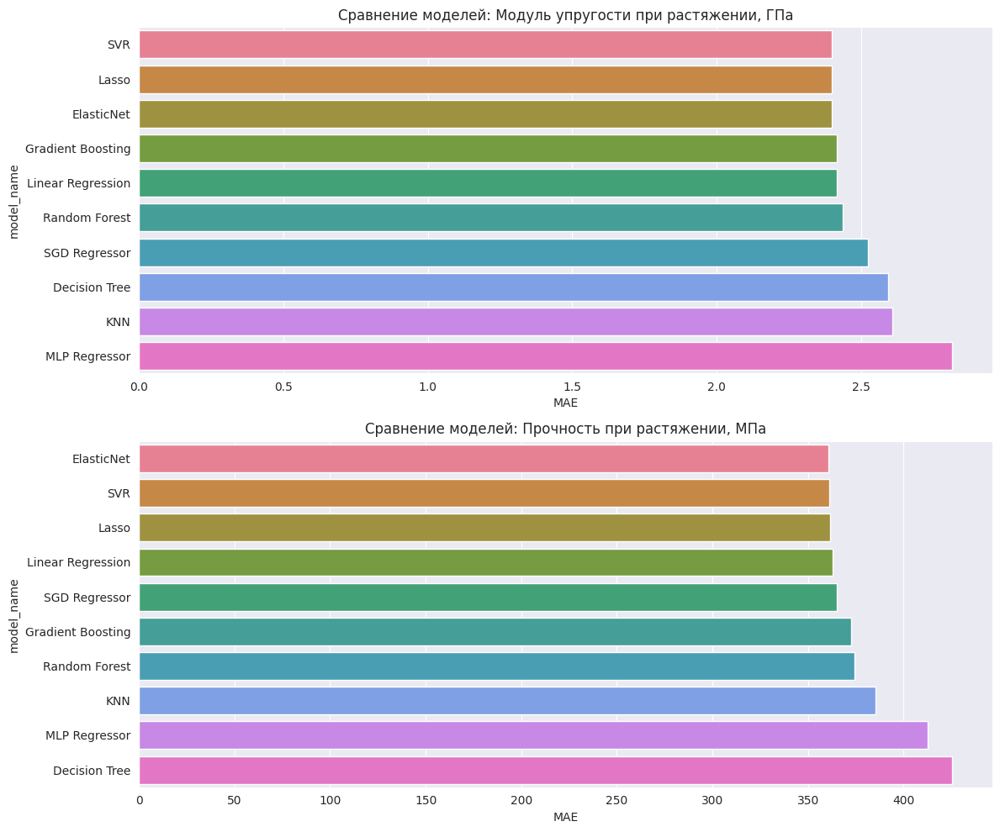

In [37]:
# Подготавливаю данные для визуализации
df_modulus_plot = df_modulus[['model_name', 'MAE']].sort_values('MAE')
df_strength_plot = df_strength[['model_name', 'MAE']].sort_values('MAE')

fig, axes = plt.subplots(2, 1, figsize=(12, 10))

# Модель упругости
sns.barplot(data=df_modulus_plot, x='MAE', y='model_name', ax=axes[0], palette='husl')
axes[0].set_title(f'Сравнение моделей: {target1}')
axes[0].set_xlabel('MAE')

# Модель прочности
sns.barplot(data=df_strength_plot, x='MAE', y='model_name', ax=axes[1], palette='husl')
axes[1].set_title(f'Сравнение моделей: {target2}')
axes[1].set_xlabel('MAE')

plt.tight_layout()
plt.show()

## Анализ важности признаков (для лучшей "древовидной" модели)

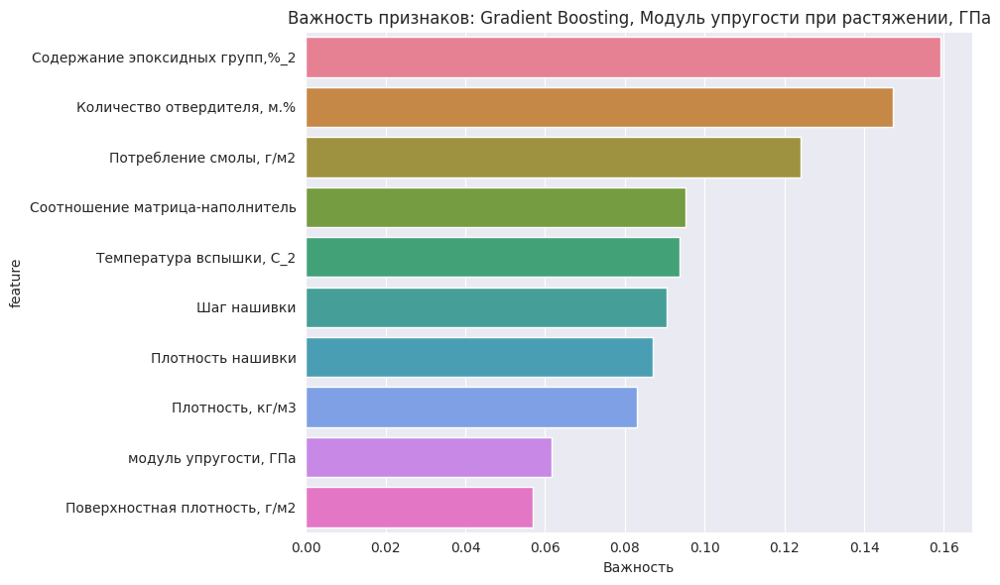


Топ-10 признаков для Модуль упругости при растяжении, ГПа (модель: Gradient Boosting):
                        feature  importance
Содержание эпоксидных групп,%_2      0.1592
    Количество отвердителя, м.%      0.1471
        Потребление смолы, г/м2      0.1241
Соотношение матрица-наполнитель      0.0952
       Температура вспышки, С_2      0.0938
                    Шаг нашивки      0.0906
              Плотность нашивки      0.0871
               Плотность, кг/м3      0.0831
          модуль упругости, ГПа      0.0617
  Поверхностная плотность, г/м2      0.0569


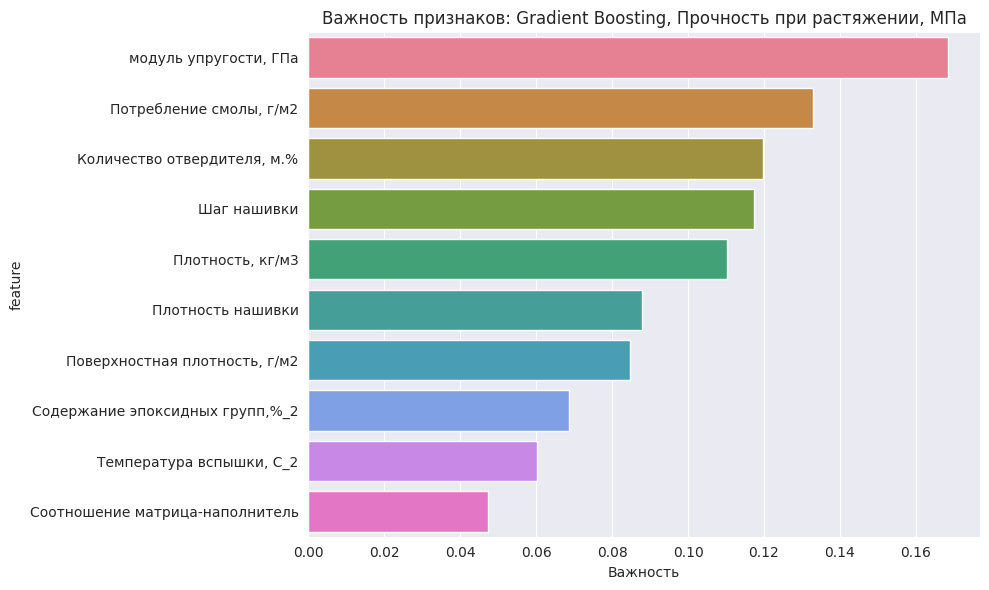


Топ-10 признаков для Прочность при растяжении, МПа (модель: Gradient Boosting):
                        feature  importance
          модуль упругости, ГПа      0.1685
        Потребление смолы, г/м2      0.1330
    Количество отвердителя, м.%      0.1196
                    Шаг нашивки      0.1175
               Плотность, кг/м3      0.1103
              Плотность нашивки      0.0878
  Поверхностная плотность, г/м2      0.0848
Содержание эпоксидных групп,%_2      0.0687
       Температура вспышки, С_2      0.0601
Соотношение матрица-наполнитель      0.0472


In [38]:
# Определяю "древовидные" модели
tree_based_models = ['Random Forest', 'Gradient Boosting', 'Decision Tree']

# Ищу лучшую из 3х древовидных
def plot_feature_importance(target_name, results_list, top_n=10):
    best_tree_model = None
    for res in results_list:
        if res['model_name'] in tree_based_models:
            if best_tree_model is None or res['MAE'] < best_tree_model['MAE']:
                best_tree_model = res

    if best_tree_model is None:
        print(f"Для {target_name} нет древовидных моделей.")
        return

    model = best_tree_model['best_model'].named_steps['model']
    importances = model.feature_importances_
    feature_names = X.columns

# Создаю датафрейм и сортирую
    feat_imp = pd.DataFrame({
        'feature': feature_names,
        'importance': importances
    }).sort_values('importance', ascending=False).head(top_n)

# Рисую график
    plt.figure(figsize=(10, 6))
    sns.barplot(data=feat_imp, x='importance', y='feature', palette='husl')
    plt.title(f'Важность признаков: {best_tree_model["model_name"]}, {target_name}')
    plt.xlabel('Важность')
    plt.tight_layout()
    plt.show()

# Табличная визуализация
    print(f"\nТоп-{top_n} признаков для {target_name} (модель: {best_tree_model['model_name']}):")
    print(feat_imp.to_string(index=False, float_format="%.4f"))

plot_feature_importance(target1, results[target1])
plot_feature_importance(target2, results[target2])

# 4. НЕЙРОННАЯ СЕТЬ: ПРЕДСКАЗАНИЕ СООТНОШЕНИЯ МАТРИЦА-НАПОЛНИТЕЛЬ

In [39]:
# Перенесла наверх
'''# Нейронная сеть для предсказания "Соотношение матрица-наполнитель"
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping'''

'# Нейронная сеть для предсказания "Соотношение матрица-наполнитель"\nfrom sklearn.model_selection import train_test_split\nimport tensorflow as tf\nfrom tensorflow import keras\nfrom tensorflow.keras import layers\nfrom tensorflow.keras.callbacks import EarlyStopping'

In [40]:
# Целевая переменная
target = 'Соотношение матрица-наполнитель'

# Признаки - всё, кроме целевой и итоговых механических свойств
exclude_cols = [
    'Соотношение матрица-наполнитель'
]
''' ,'Модуль упругости при растяжении, ГПа'
    ,'Прочность при растяжении, МПа'
]'''

X_mn = df.drop(columns=exclude_cols)
y_mn = df[[target]]

In [41]:
# Разделение на обучающую и тестовую выборки
X_train_mn, X_test_mn, y_train_mn, y_test_mn = train_test_split(
    X_mn, y_mn, test_size=0.2, random_state=42
)

In [42]:
# Нормализация с использованием встроенного слоя Keras
normalizer_mn = tf.keras.layers.Normalization(axis=-1)
normalizer_mn.adapt(X_train_mn.values)

In [43]:
# Построение модели
model_mn = keras.Sequential([
    normalizer_mn,
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(96, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(64, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(32, activation='relu'),
    layers.Dense(16, activation='relu'),
    layers.Dense(1, activation='linear')  # регрессия - линейная активация на выходе
])

In [44]:
# Компиляция модели
model_mn.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='mean_absolute_error',
    metrics=['mean_absolute_error']
)

In [45]:
# Callbacks
early_stop_mn = EarlyStopping(
    monitor='val_loss',
    patience=15,
    restore_best_weights=True,
    verbose=1
)

In [46]:
# Обучение модели
history_mn = model_mn.fit(
    X_train_mn,
    y_train_mn,
    batch_size=32,
    epochs=200,
    validation_split=0.2,
    callbacks=[early_stop_mn],
    verbose=1
)

Epoch 1/200
19/19 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 2.4191 - mean_absolute_error: 2.4191 - val_loss: 2.6190 - val_mean_absolute_error: 2.6190
Epoch 2/200
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 1.3595 - mean_absolute_error: 1.3595 - val_loss: 2.2376 - val_mean_absolute_error: 2.2376
Epoch 3/200
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.9597 - mean_absolute_error: 0.9597 - val_loss: 2.0141 - val_mean_absolute_error: 2.0141
Epoch 4/200
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.8395 - mean_absolute_error: 0.8395 - val_loss: 1.8312 - val_mean_absolute_error: 1.8312
Epoch 5/200
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.8388 - mean_absolute_error: 0.8388 - val_loss: 1.6412 - val_mean_absolute_error: 1.6412
Epoch 6/200
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7555 - mean_absolute_error: 0.7555 - val_loss: 1.4149 - val_mean_absolute_error: 1.4149
Epoch 7/200
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.6945 - mean_absolute_error: 0.6945 - val_

In [47]:
# Вывод архитектуры
model_mn.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ normalization (Normalization)   │ (None, 12)             │            25 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │         1,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 96)             │        12,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 96)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 70,206 (274.25 KB)

 Trainable params: 23,265 (90.88 KB)

 Non-trainable params: 409 (1.60 KB)

 Optimizer params: 46,532 (181.77 KB)

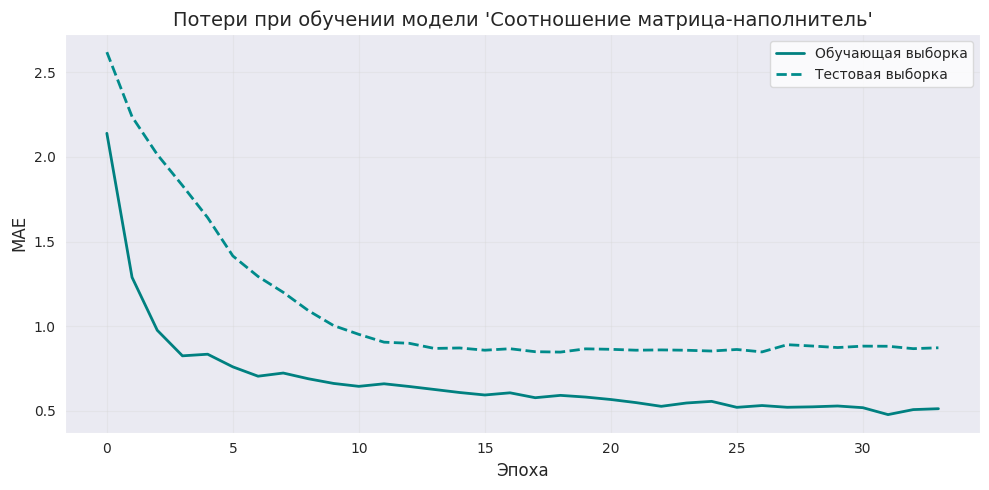

In [48]:
# График потерь
def plot_loss(history, title="График потерь модели"):
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], color='teal', label='Обучающая выборка', linewidth=2)
    plt.plot(history.history['val_loss'], color='darkcyan', linestyle='--', label='Тестовая выборка', linewidth=2)
    plt.title(title, fontsize=14)
    plt.xlabel('Эпоха', fontsize=12)
    plt.ylabel('MAE', fontsize=12)
    plt.legend(frameon=True, facecolor='white', edgecolor='lightgray')
    plt.grid(True, alpha=0.3, color='lightgray')
    plt.tight_layout()
    plt.show()

plot_loss(history_mn, "Потери при обучении модели 'Соотношение матрица-наполнитель'")

In [49]:
# Оценка модели
y_pred_mn = model_mn.predict(X_test_mn)

from sklearn.metrics import mean_absolute_error
mae_mn = mean_absolute_error(y_test_mn, y_pred_mn)

# Базовый MAE (прогноз константой = среднее)
mae_baseline = np.mean(np.abs(y_test_mn - y_test_mn.mean()))

print(f"MAE модели: {mae_mn:.4f}")
print(f"MAE среднего значения: {mae_baseline:.4f}")

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
MAE модели: 0.7860
MAE среднего значения: 0.6812


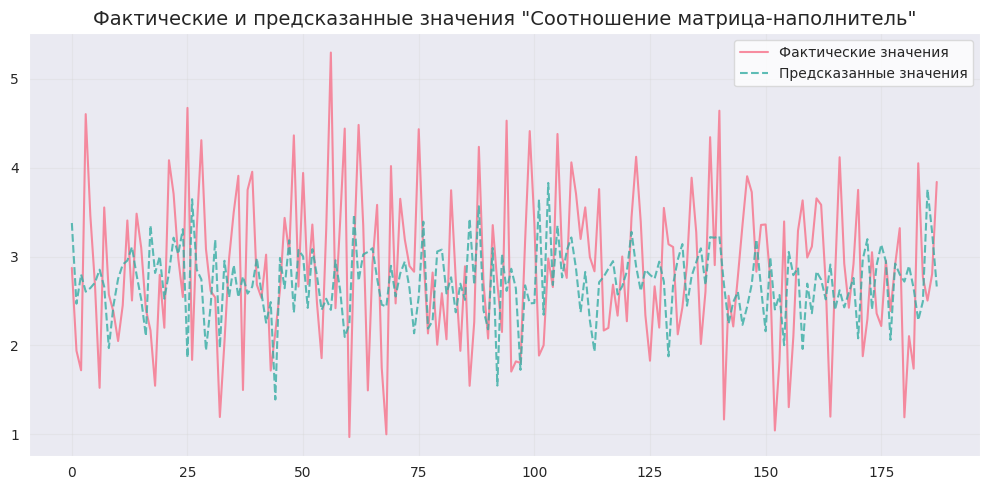

In [50]:
# Визуализация: фактические vs предсказанные
plt.figure(figsize=(10, 5))
palette = sns.color_palette("husl", 2)
plt.plot(y_test_mn.values, color=palette[0], label='Фактические значения', alpha=0.8, linewidth=1.5)
plt.plot(y_pred_mn, color=palette[1], label='Предсказанные значения', alpha=0.8, linewidth=1.5, linestyle='--')
plt.title('Фактические и предсказанные значения "Соотношение матрица-наполнитель"', fontsize=14)
plt.legend(frameon=True, facecolor='white', edgecolor='lightgray')
plt.grid(True, alpha=0.3, color='lightgray')
plt.tight_layout()
plt.show()

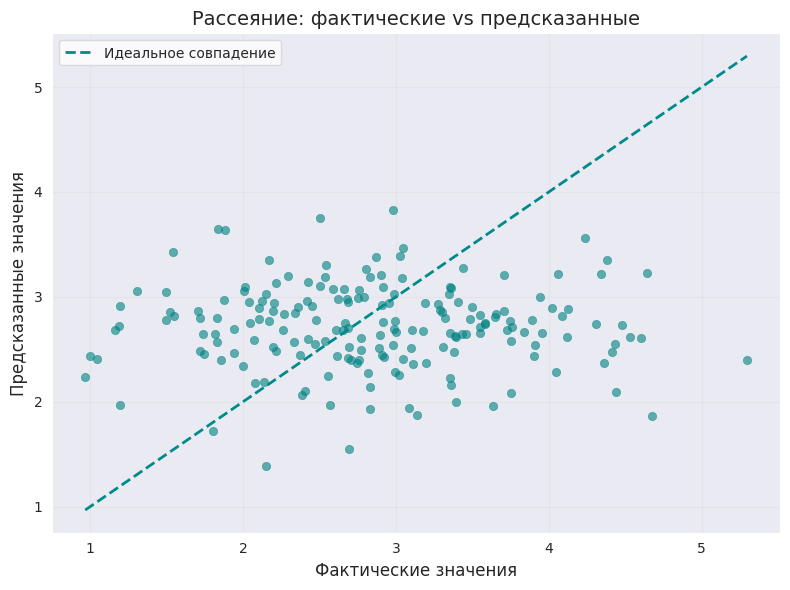

In [51]:
# Точечный график
plt.figure(figsize=(8, 6))
plt.scatter(y_test_mn, y_pred_mn, color='teal', alpha=0.6, edgecolors='darkcyan', linewidth=0.5)
# Линия идеального совпадения
min_val, max_val = y_test_mn.min(), y_test_mn.max()
plt.plot([min_val, max_val], [min_val, max_val], color='darkcyan', linestyle='--', linewidth=2, label='Идеальное совпадение')
plt.xlabel('Фактические значения', fontsize=12)
plt.ylabel('Предсказанные значения', fontsize=12)
plt.title('Рассеяние: фактические vs предсказанные', fontsize=14)
plt.legend(frameon=True, facecolor='white', edgecolor='lightgray')
plt.grid(True, alpha=0.3, color='lightgray')
plt.tight_layout()
plt.show()

# 5. СОЗДАНИЕ ПРИЛОЖЕНИЯ ДЛЯ ПРЕДСКАЗАНИЯ СООТНОШЕНИЯ МАТРИЦА-НАПОЛНИТЕЛЬ

In [52]:
# Сохраняю модель
model_mn.save('model_mn.keras')
print("Модель сохранена: model_mn.keras")

Модель сохранена: model_mn.keras


In [53]:
# Перенесла наверх
'''import os'''

# Создаю папки
os.makedirs('app', exist_ok=True)
os.makedirs('app/s_model', exist_ok=True)
os.makedirs('app/templates', exist_ok=True)

In [54]:
# Копирую модель в папку s_model
!cp model_mn.keras app/s_model/

In [55]:
# Создаю html файл для приложения
html_code = """
<!DOCTYPE html>
<html lang="ru">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title>Прогноз соотношения матрица-наполнитель</title>
    <style>
        body {
            font-family: -apple-system, BlinkMacSystemFont, "Segoe UI", Roboto, Helvetica, Arial, sans-serif;
            background-color: #1E1E20; /* Фон бэкграунда */
            color: #292929; /* Основной шрифт */
            margin: 0;
            padding: 20px;
            line-height: 1.6;
        }
        .container {
            max-width: 600px;
            margin: 40px auto;
            background-color: #FFFFFF; /* Цвет контейнера */
            padding: 32px;
            border-radius: 12px; /* Скругленные углы */
        }
        h1 {
            font-size: 2.1rem;
            font-weight: 600;
            text-align: center;
            margin: 0 0 8px;
        }
        h2 {
            font-size: 1.2rem;
            font-weight: 400;
            text-align: center;
            margin: 0 0 28px;
            color: #292929; /* Цвет побочного шрифта */
        }
        form {
            display: flex;
            flex-direction: column;
            gap: 20px;
        }
        label {
            display: flex;
            flex-direction: column;
            font-weight: 500;
            font-size: 1rem;
        }
        label span {
            margin-bottom: 6px;
            font-size: 0.95rem;
            color: #292929; /* Цвет шрифта параметров */
        }
        input[type="text"] {
            padding: 12px 14px;
            border: 1px solid #292929; /* Рамка у окошек ввода */
            border-radius: 8px;
            background-color: #292929; /* Цвет окошек ввода */
            font-size: 1rem;
            color:#E3E3E3;
            transition: border-color 0.2s ease;
        }
        input[type="text"]:focus {
            outline: none;
            border-color: #E5742A; /* Акцентный цвет при выборе окошка ввода */
        }
        .button-group {
            display: flex;
            gap: 12px;
            margin-top: 10px;
        }
        .btn {
            flex: 1;
            padding: 12px;
            border: none;
            border-radius: 8px;
            font-size: 1.05rem;
            font-weight: 600;
            cursor: pointer;
            transition: background-color 0.2s ease, transform 0.15s ease;
        }
        .btn-submit {
            background-color: #292929; /* Основной цвет кнопки Готово */
            color: #E3E3E3;
        }
        .btn-submit:hover {
            background-color: #73939C; /* Контрастный цвет кнопки Готово при наведении */
            color: #BAD2D9;
            transform: translateY(-1px);
        }
        .btn-clear {
            background-color: #292929; /* Основной цвет кнопки Очистить */
            color: #E3E3E3;
        }
        .btn-clear:hover {
            background-color: #9B7754; /* Контрастный цвет кнопки Очистить при наведении */
            color: #E6C9AD;
            transform: translateY(-1px);
        }
        .result {
            margin-top: 32px;
            padding: 20px;
            background-color: #BAD2D9; /* Цвет фона для результата */
            border-radius: 10px;
            font-size: 1.25rem;
            text-align: center;
            font-weight: 500;
        }
        .result strong {
            color: #607D85;
        }
        /* Адаптивность для мобильных устройств */
        @media (max-width: 600px) {
            .container {
                padding: 24px;
            }
            .button-group {
                flex-direction: column;
            }
        }
    </style>
</head>
<body>
    <div class="container">
        <h1>Прогнозное значение параметра<br>«Соотношение матрица-наполнитель»</h1>
        <h2>Заполните поля и нажмите «Готово»</h2>
        <form method="POST" id="predictionForm">
            {% for feature in features_for_ratio %}
                <label>
                    <span>{{ feature }}</span>
                    <!-- Сохраняю введённые значения после отправки формы -->
                    <input
                        type="text"
                        name="{{ feature }}"
                        value="{{ request.form.get(feature, '') }}"
                        required
                    >
                </label>
            {% endfor %}
            <div class="button-group">
                <button type="submit" class="btn btn-submit">Готово</button>
                <button type="button" class="btn btn-clear" onclick="clearForm()">Очистить</button>
            </div>
        </form>

        {% if result is not none %}
            <div class="result">
                Результат прогноза: <strong>{{ result }}</strong>
            </div>
        {% endif %}
    </div>

    <script>
        // Реализую очистку полей ввода
        function clearForm() {
            document.querySelectorAll('#predictionForm input[type="text"]').forEach(input => {
                input.value = '';
            });
        }
    </script>
</body>
</html>
"""

# Сохраняю HTML в файл
with open('app/templates/index.html', 'w', encoding='utf-8') as f:
    f.write(html_code)

In [56]:
# Создаю app.py файл для запуска приложения

app_py = """
from flask import Flask, render_template, request
from tensorflow.keras.models import load_model
import numpy as np

app = Flask(__name__)

# Загружаю модель
model = load_model('s_model/model_mn.keras')

# Передаю список признаков, на которых обучена модель
FEATURES_FOR_RATIO = [
    'Плотность, кг/м3',
    'модуль упругости, ГПа',
    'Количество отвердителя, м.%',
    'Содержание эпоксидных групп,%_2',
    'Температура вспышки, С_2',
    'Поверхностная плотность, г/м2',
    'Модуль упругости при растяжении, ГПа',
    'Прочность при растяжении, МПа',
    'Потребление смолы, г/м2',
    'Угол нашивки',
    'Шаг нашивки',
    'Плотность нашивки'
]

@app.route('/', methods=['GET', 'POST'])
def index():
    result = None
    # Сохраняю введённые значения
    form_data = {}
    for feature in FEATURES_FOR_RATIO:
        form_data[feature] = request.form.get(feature, '')

    if request.method == 'POST':
        try:
            # Собираю только нужные 10 значений в правильном порядке
            input_data = []
            for feature in FEATURES_FOR_RATIO:
                value = float(request.form[feature])
                input_data.append(value)

            # Прогноз
            input_array = np.array([input_data])  # shape (1, 10)
            prediction = model.predict(input_array)[0][0]
            result = round(prediction, 4)

        except Exception as e:
            result = f"Ошибка: {str(e)}"

    return render_template(
        'index.html',
        features_for_ratio=FEATURES_FOR_RATIO,
        form_data=form_data,
        result=result
    )

if __name__ == '__main__':
    app.run(debug=True)
"""

# Сохраняю app.py
with open('app.py', 'w', encoding='utf-8') as f:
    f.write(app_py)

In [57]:
# Копирую app.py в корень папки app
!cp app.py app/

# Архивирую всю папку
!zip -r composite_app.zip app/

# Скачиваю архив с приложением
# Импорт перенесла наверх
'''from google.colab import files'''
files.download('composite_app.zip')

  adding: app/ (stored 0%)
  adding: app/s_model/ (stored 0%)
  adding: app/s_model/model_mn.keras (deflated 22%)
  adding: app/app.py (deflated 53%)
  adding: app/templates/ (stored 0%)
  adding: app/templates/index.html (deflated 68%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>